# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = './results/'

In [3]:
os.makedirs('figures//heatmaps', exist_ok=True)
os.makedirs('figures/snakeplots', exist_ok=True)

In [4]:
os.listdir(de_dir_path)

['anova_zscore_mamm.csv',
 'ttest_zscore_human_monkeys.csv',
 'ttest_zscore_mamm.csv']

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']
cluster_color = ['red', 'blue', 'green',  'yellow', 'orange', 'purple', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_zscore_mamm.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,6.384890,12.0,0.813337,0.635908,0.716158
HES4,15.058197,12.0,1.878258,0.052758,0.121203
AGRN,15.583493,12.0,3.171660,0.001230,0.007732
SDF4,14.214074,12.0,1.574430,0.120231,0.220228
B3GALT6,12.113356,12.0,1.676662,0.091658,0.181660


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_zscore_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.334627,0.749294,0.871771
1,ANKRD65,L1,human,chimp,-0.558470,0.596733,0.772328
2,TMEM240,L1,human,chimp,2.100247,0.080450,0.274743
3,NADK,L1,human,chimp,-5.641027,0.001330,0.038326
4,GNB1,L1,human,chimp,0.164405,0.874811,0.941712


## Load normalized pseudobulks

In [8]:
pb_dir_path = '../../../data/pseudobulks/'

In [9]:
os.listdir(pb_dir_path)

['annotation_chimp.csv',
 'annotation_human.csv',
 'annotation_macaque.csv',
 'annotation_spatial_libd_human.csv',
 'expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_mean_chimp.csv',
 'expression_mean_human.csv',
 'expression_mean_macaque.csv',
 'expression_mean_spatial_libd_human.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_sum_human.csv',
 'expression_sum_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'gene_sample_mean_chimp.csv',
 'gene_sample_mean_human.csv',
 'gene_sample_mean_macaque.csv',
 'gene_sample_mean_spatial_libd_human.csv',
 'pb_age.h5ad',
 'pb_age_sample_norm.h5ad',
 'pb_age_sample_norm_zscore.h5ad',
 'pb_mamm.h5ad',
 'pb_mamm_filtered.h5ad',
 'pb_mamm_laminar_filtered.h5ad',
 'pb_mamm_laminar_sample_zscore_filtered.h5ad',
 'pb_mamm_sample_norm.h5ad',
 'pb_mamm_sample_norm_filtered.h5ad',
 'pb_mamm_sample_norm_zscore.h5ad',
 'pb_mamm_sample_zscore_filtered.h5ad']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mamm_sample_zscore_filtered.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# Visualisation

## PCA

In [11]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,AGRN,ANKRD65,TMEM240,NADK,GNB1,GABRD,TP73,CHD5,GPR153,PLEKHG5,...,BACE2,RSPH1,NDUFV3,RRP1,PFKL,COL18A1,COL6A2,LSS,S100B,PRMT2
WM.human_759,-0.587605,-0.576557,-0.380610,-0.392677,-0.483306,1.407958,-0.575692,0.715740,-1.468521,-1.837898,...,1.663898,-0.853417,1.184517,0.583662,-0.296142,0.451379,-0.369059,0.091970,-0.043002,1.253314
L5.human_759,1.094584,-1.222160,0.233380,0.448628,-0.063677,-1.209827,1.122904,1.013839,-0.590731,0.684865,...,-0.193066,-0.151746,0.630000,-0.158218,1.209057,-0.710637,0.304568,-0.169549,-0.537251,-0.525737
L2.human_759,-1.277674,0.650135,-1.163493,0.107402,0.628297,-1.416184,-0.575692,-0.400103,-0.115422,-0.453934,...,-1.020129,-0.139674,-1.302302,-0.311605,-0.122511,-0.080439,-0.827055,-1.230772,-0.326476,0.482834
L3.human_759,0.755363,1.485988,-0.707767,-0.631591,0.896980,0.611115,-0.575692,0.399211,0.570003,1.309722,...,-0.588167,0.970819,-0.055759,0.699986,0.081439,-0.594865,-0.448743,-0.094421,-0.521913,-0.859364
L1.human_759,-0.816885,0.534018,-0.439080,-0.663356,-1.988943,0.109264,1.755557,-1.966820,1.725375,0.016130,...,-0.323008,-0.830282,-1.422980,-1.837171,-1.494951,2.068605,2.137187,1.874758,2.236617,0.875557


In [12]:
human_specific_genes = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique().tolist()
df_hs = df[human_specific_genes].copy()
df_hs.head()

,NADK,PPCS,S1PR1,ANKRD34A,RGS5,ACBD6,PROX1,CENPF,RAB3GAP2,PRKCE,...,YJEFN3,TMEM91,TRPM4,PRKCG,CACNG8,SEPTIN5,UBE2L3,PATZ1,PCP4,LSS
WM.human_759,-0.392677,0.758280,-0.341394,-0.385711,-1.119006,0.234255,-0.151581,0.602374,1.151617,0.711588,...,1.551342,1.733983,0.966918,0.114232,1.272177,0.405211,-0.188431,-0.409963,0.664573,0.091970
L5.human_759,0.448628,0.792589,-0.455196,0.046159,1.466425,-0.526880,-1.139455,-0.240792,1.181084,0.275703,...,-0.017360,0.241038,-0.638352,1.033981,0.570235,-0.942861,0.327301,-0.115630,1.217401,-0.169549
L2.human_759,0.107402,0.196601,0.138148,0.447258,-0.850995,1.075415,1.615833,-0.736982,-1.360178,0.360240,...,-0.998445,-0.316828,-0.641544,-0.669504,0.770997,-0.443740,-1.831471,1.115916,-1.042206,-1.230772
L3.human_759,-0.631591,0.753396,-0.340811,-0.050216,-0.659236,0.183212,-0.122255,-0.621016,-0.128751,-0.044623,...,0.359737,-1.055126,-1.009256,-0.568031,-1.192581,-0.055818,-0.360380,-0.653338,-1.093389,-0.094421
L1.human_759,-0.663356,-2.000604,2.188188,-1.868543,0.694638,1.265362,1.010690,1.781868,-0.673689,-2.140135,...,-1.373577,-0.759999,0.589610,-1.585644,-1.424879,2.056028,1.468319,1.675584,-0.934963,1.874758


In [13]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df_hs.loc[sample_order['all']]

In [14]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

In [15]:
fig = px.scatter(components, x=0, y=1, hover_name=adata_pb_norm.var_names, color=(adata_pb_norm.var.p_val_adj < 0.05))
fig.show('notebook')

# Clusterisation of the ANOVA significant genes

## Hierarchal clustering

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



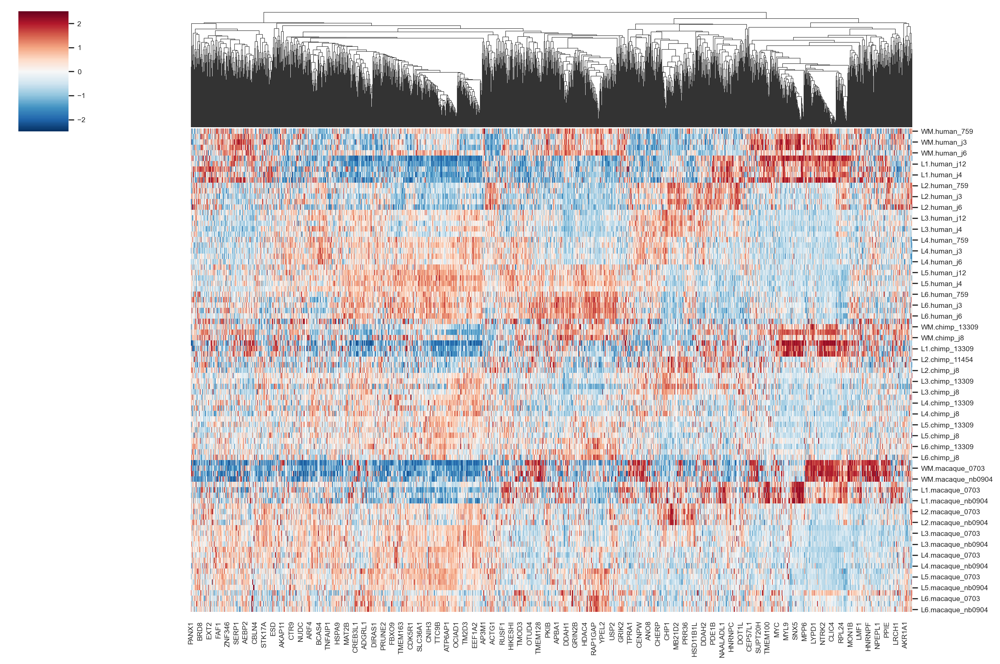

In [16]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('figures/heatmaps/clustermap_anova.png')

Clusterization for each layer

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix

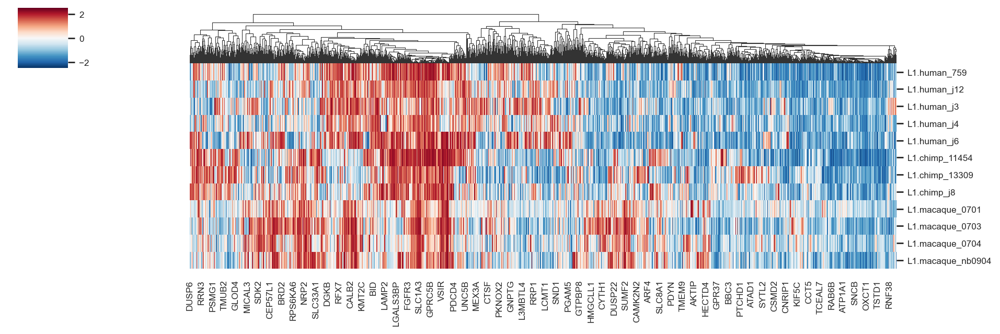

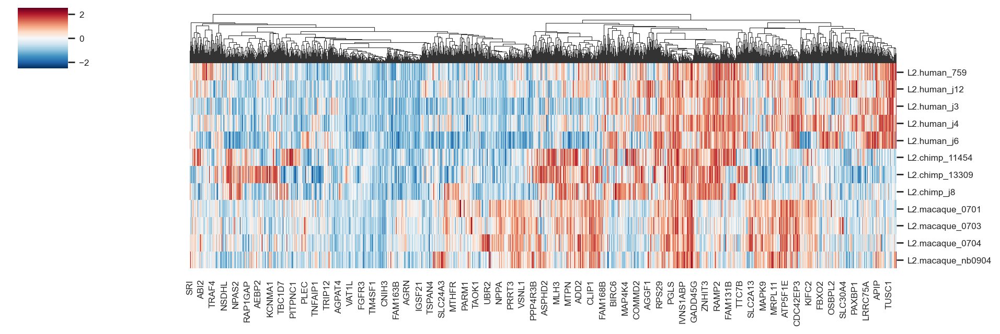

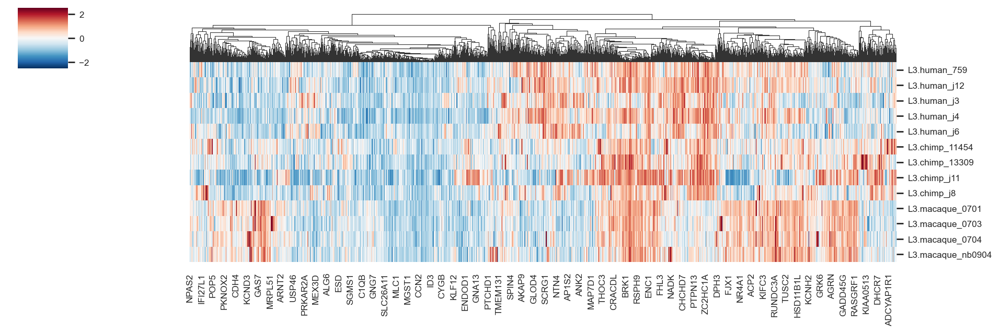

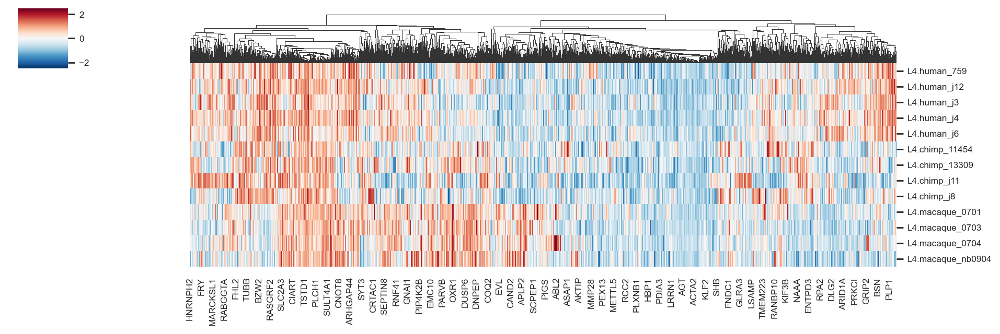

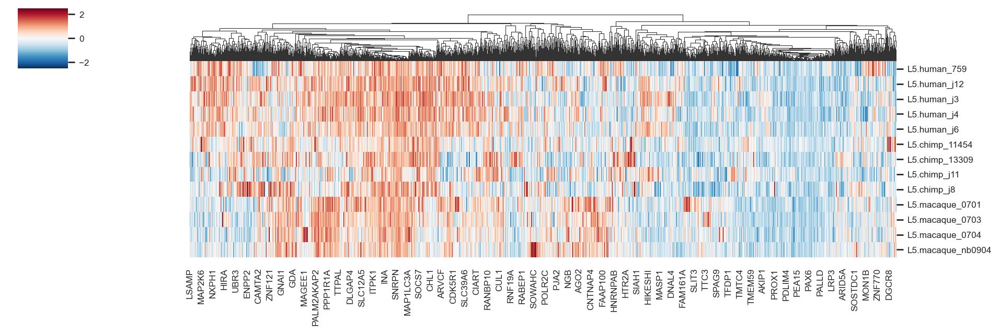

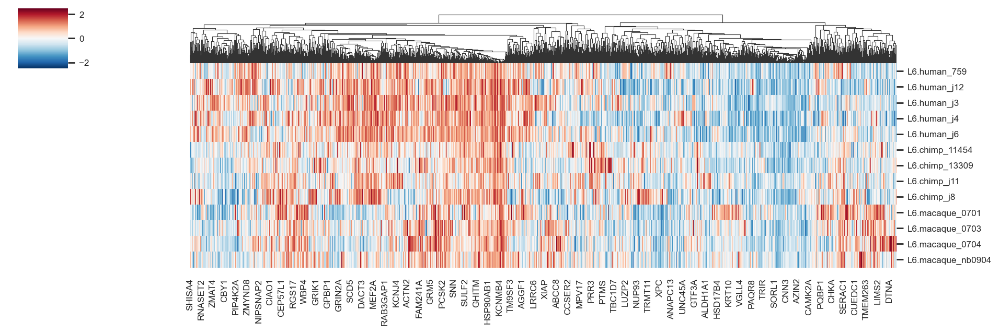

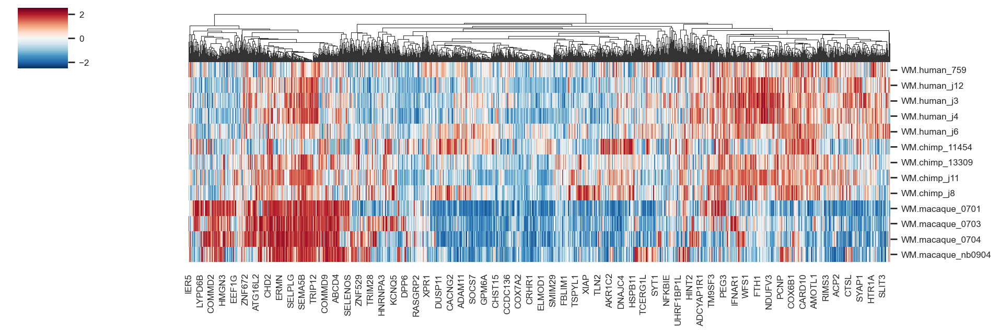

In [17]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(12, 4), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

Clusterisation for each specie

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



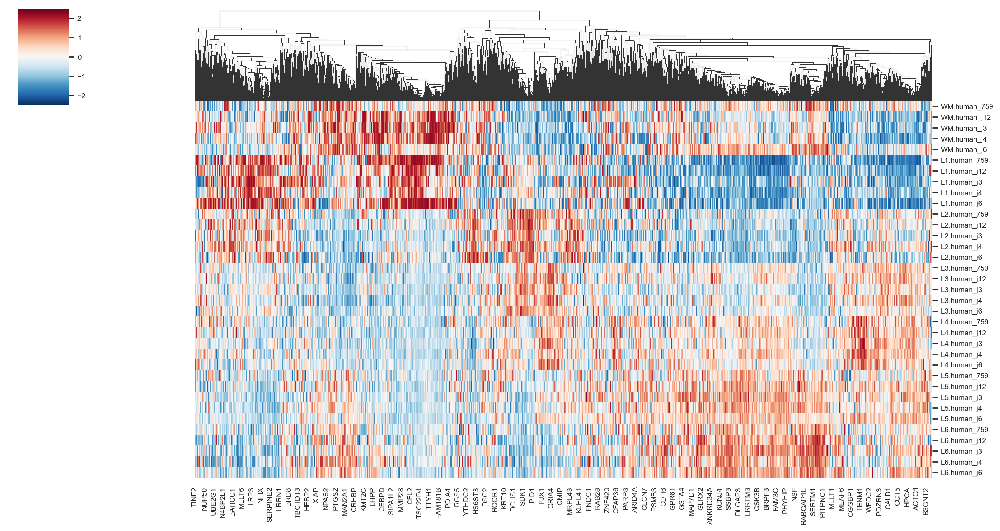

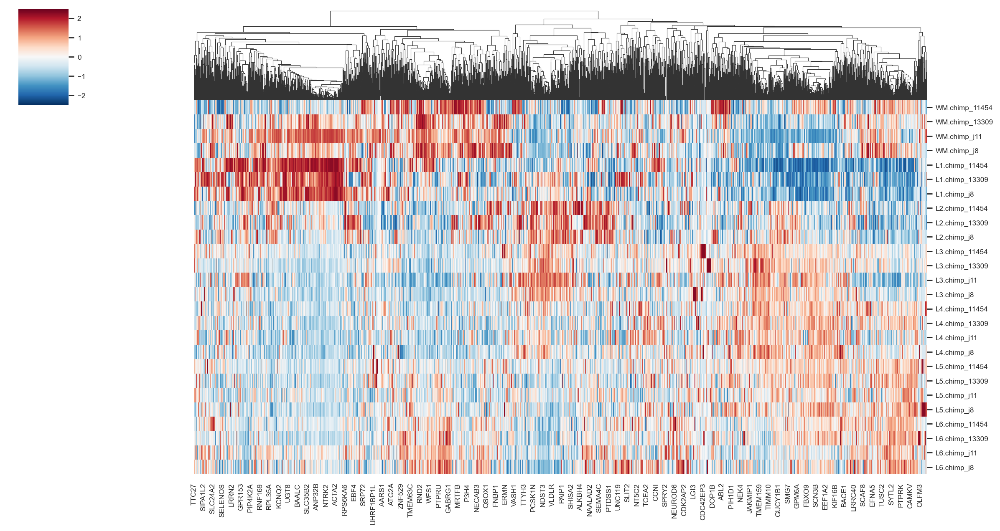

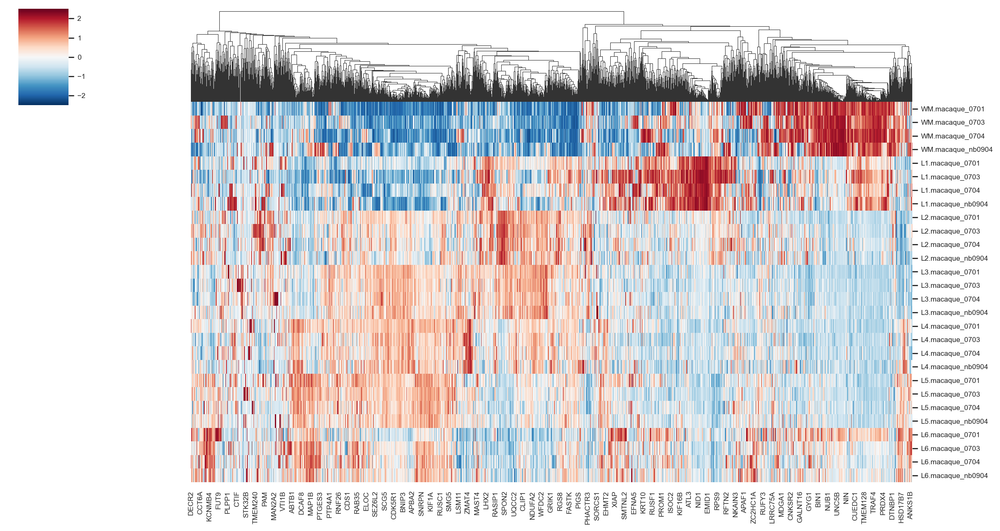

In [18]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

## Spectral clustering

### 6 clusters

#### Clustering

In [19]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 6
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=6,
                   random_state=4)

In [20]:
cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

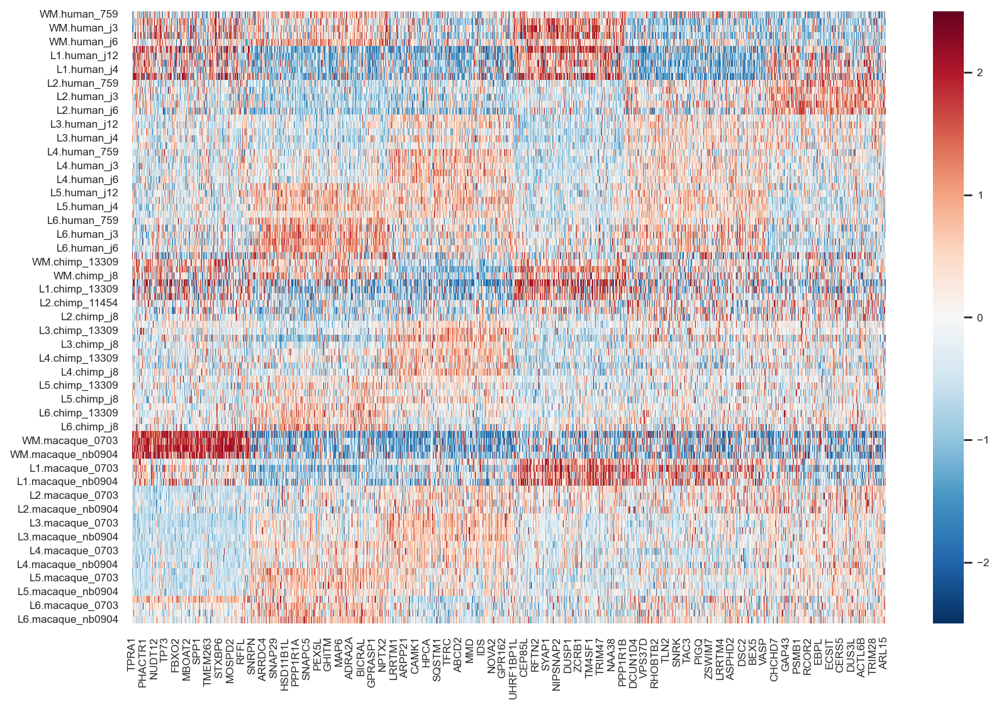

In [21]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

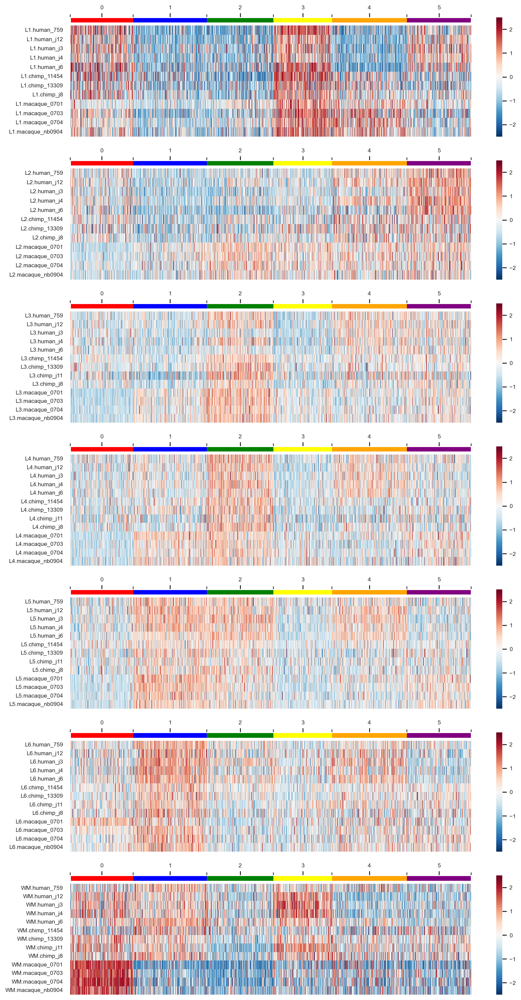

In [22]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

In [23]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [24]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN   ANKRD65   TMEM240      NADK      GNB1     GABRD  \
condition layer                                                               
chimp     L1    -1.101722  0.000000 -1.858119  1.106832 -1.316461 -0.499093   
          L2    -1.132527  0.000000 -0.140870 -1.020345  0.799343 -0.836275   
          L3    -0.105615 -0.111803 -0.063043  0.254596  0.846207  0.962491   
          L4     0.756912 -0.111803  0.526336 -0.128780  0.702200  0.408388   
          L5     0.540320 -0.111803  0.404393 -0.061237  0.086727 -0.165721   

                     TP73      CHD5    GPR153   PLEKHG5  ...     BACE2  \
condition layer                                          ...             
chimp     L1     2.032473 -1.478046  1.388855 -0.667490  ...  0.226531   
          L2    -0.622895  0.448384  0.616995  0.239202  ... -1.081238   
          L3    -0.356624  0.505970  0.664780 -0.303065  ... -0.345270   
          L4    -0.062404  0.314730 -0.174142 -0.188922  ... -0.659923   
          L5    -0.118768  0.273499 -0.903416  0.494671  ... -0.034555   

                    RSPH1    NDUFV3      RRP1      PFKL   COL18A1    COL6A2  \
condition layer                                                               
chimp     L1    -1.375371 -0.401580 -0.216324  0.719720  2.222227 -0.125988   
          L2     0.804240  0.416086  0.538423  0.215785 -0.142445 -0.125988   
          L3     0.710071 -0.698233 -0.288482 -0.170436 -0.192256 -0.206295   
          L4     0.783182 -0.449077  0.305487 -0.167374 -0.685670 -0.206295   
          L5    -0.470535  0.150024 -0.337838 -0.358772 -0.001051 -0.206295   

                      LSS     S100B     PRMT2  
condition layer                                
chimp     L1    -0.125988  1.888258 -0.855905  
          L2    -0.125988 -0.322056  0.744803  
          L3     1.005520 -0.530394 -1.139188  
          L4    -0.232370 -0.601899 -0.362514  
          L5    -0.232370 -0.610796 -0.089211  

[5 rows x 2836 columns]

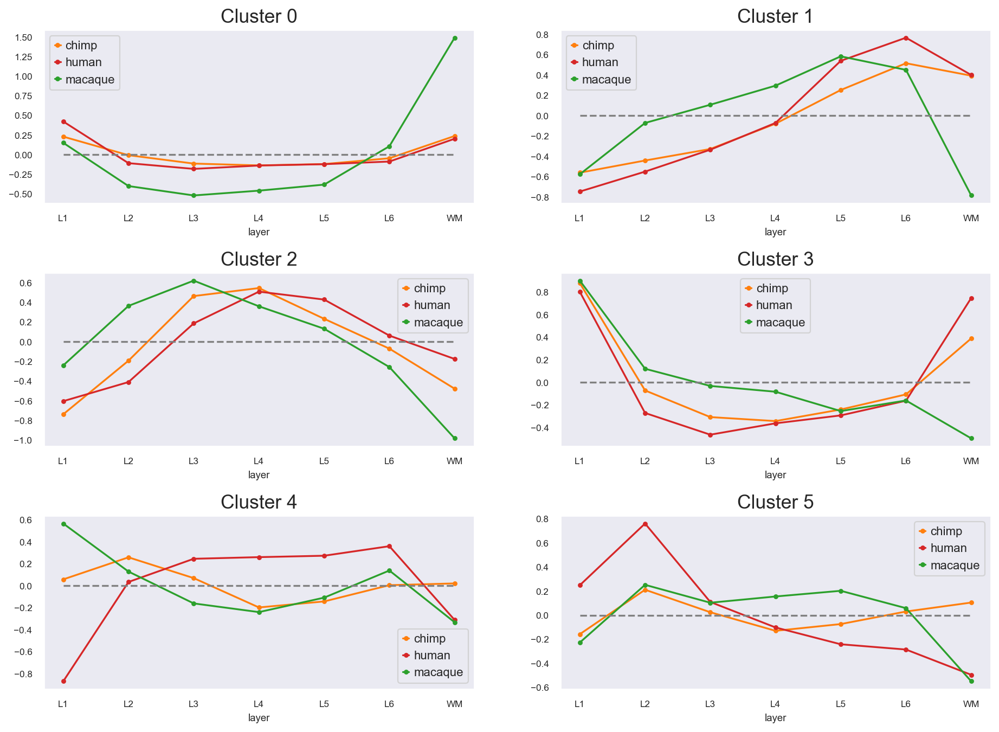

In [25]:
fig, axes = plt.subplots(n_clusters // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 7 clusters

#### Clustering

In [26]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [27]:
cl_order = {i: a for i, a in enumerate([3, 1, 4, 0, 2, 6, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

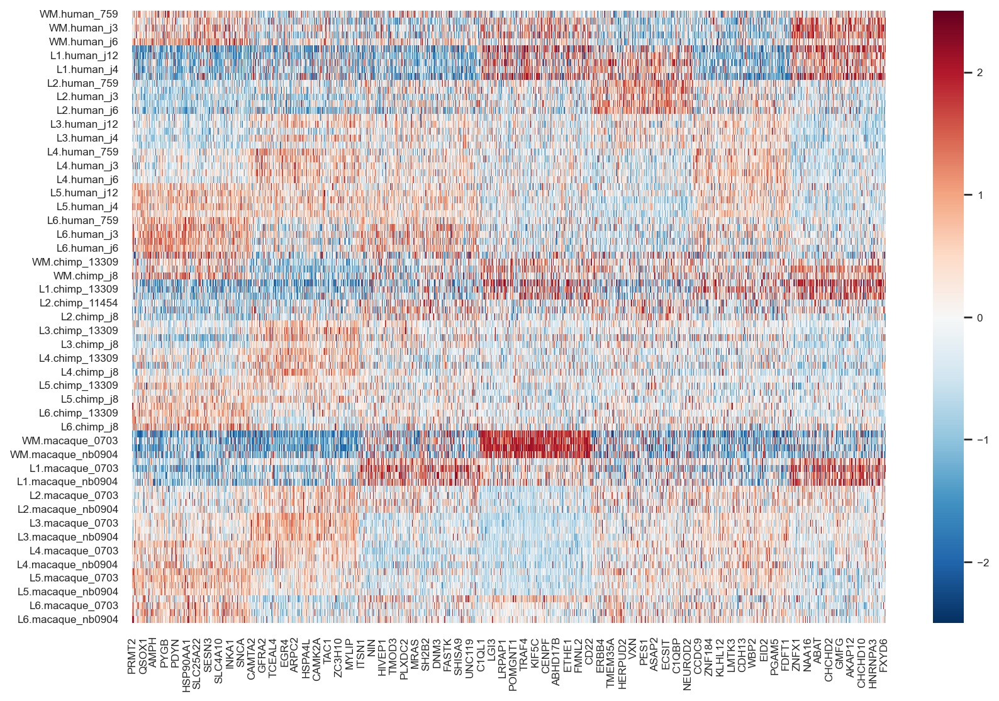

In [28]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

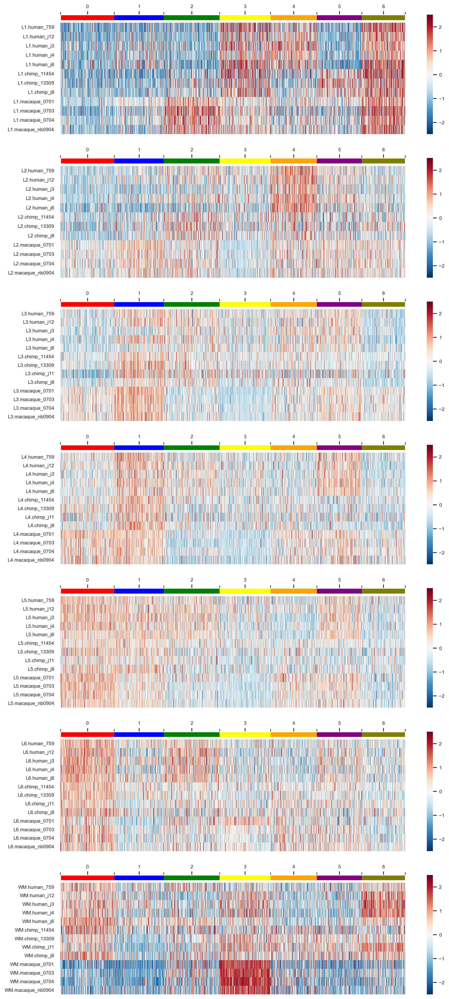

In [29]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

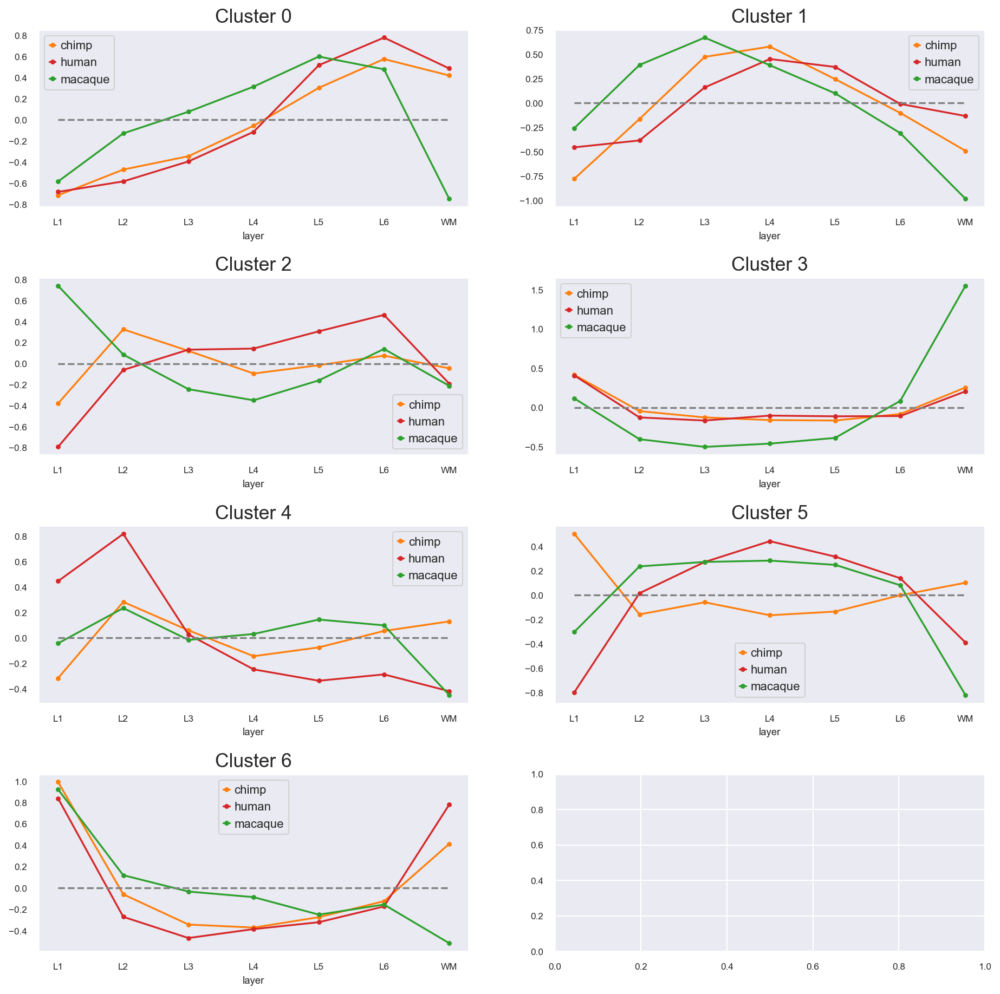

In [30]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 8 clusters

#### Clustering

In [31]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 8
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, random_state=4)

In [32]:
cl_order = {i: a for i, a in enumerate([7, 5, 2, 4, 1, 0, 6, 3])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

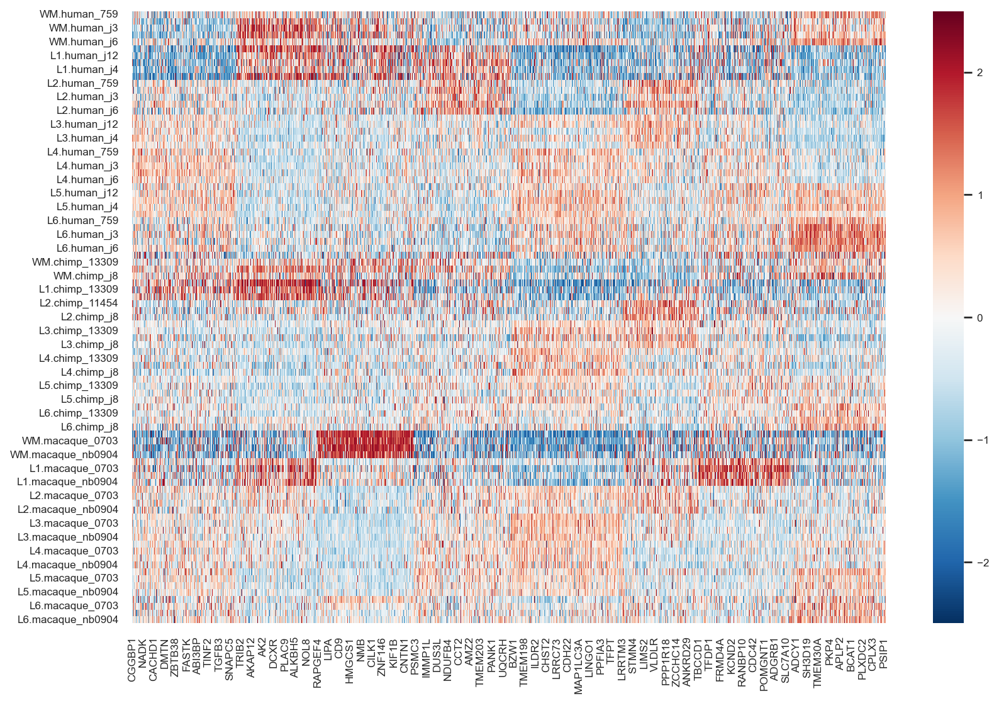

In [33]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

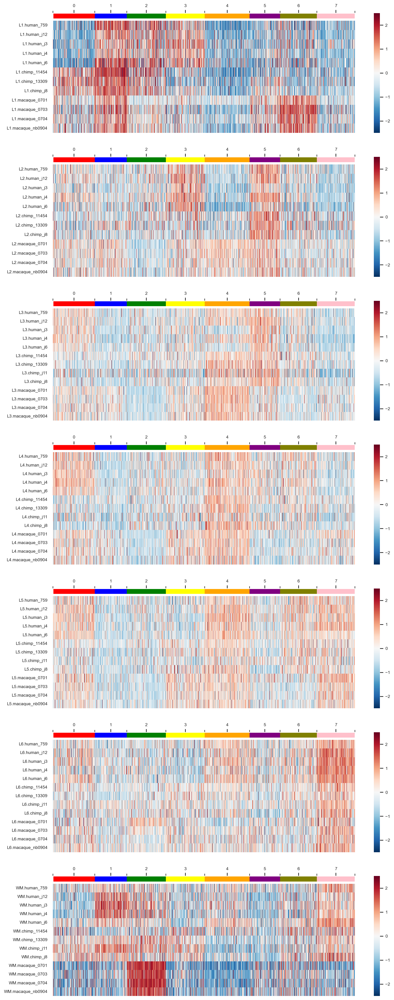

In [34]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

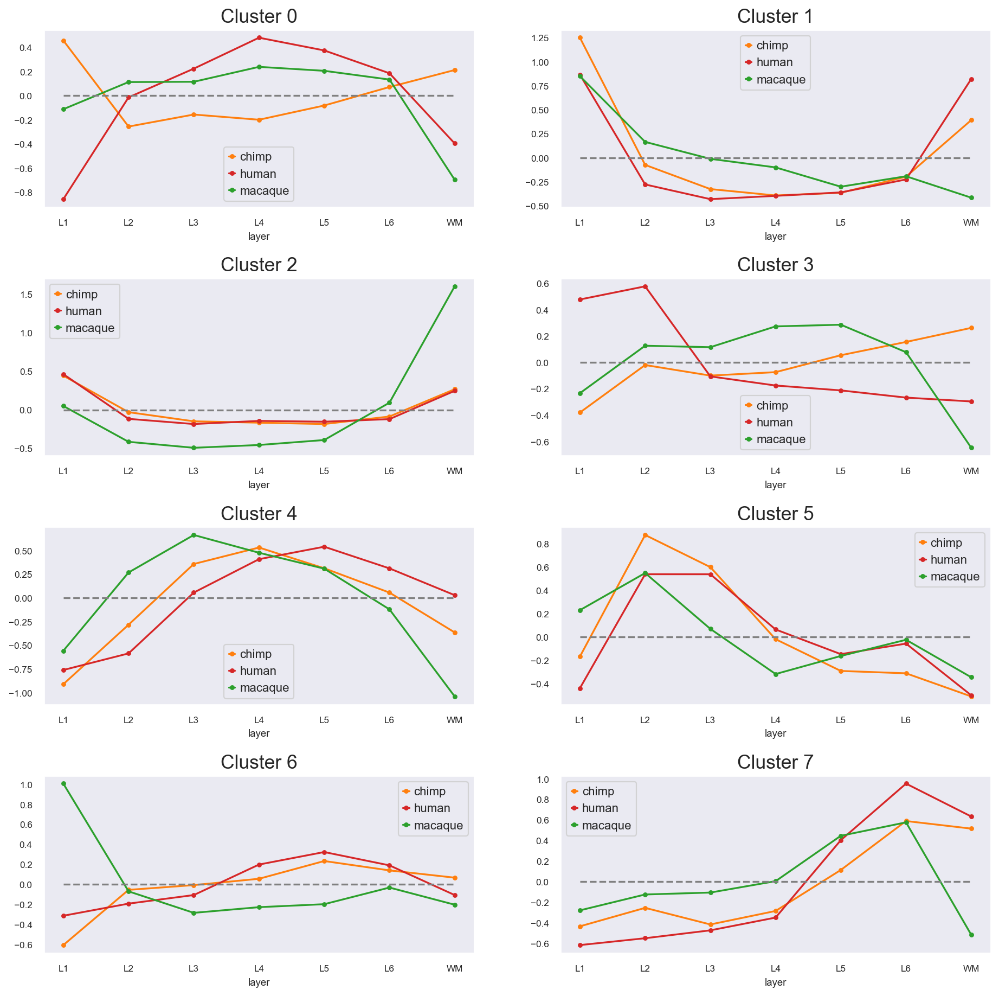

In [35]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 9 clusters

#### Clustering

In [36]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 9
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=9,
                   random_state=4)

In [37]:
cl_order = {i: a for i, a in enumerate([3, 5, 8, 0, 2, 6, 1, 7, 4])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

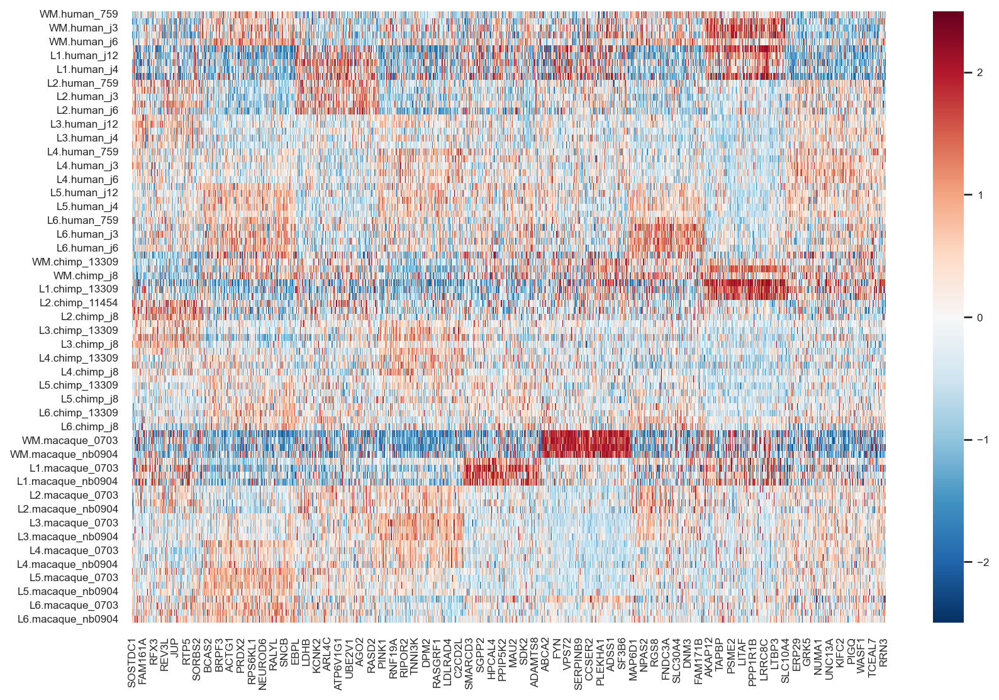

In [38]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

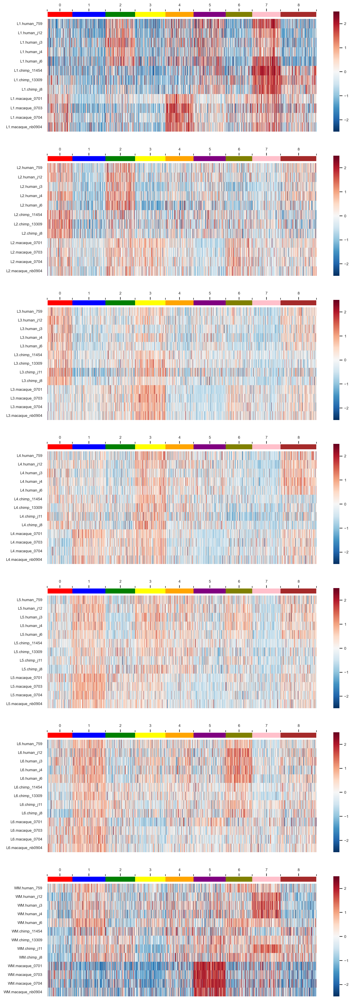

In [39]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

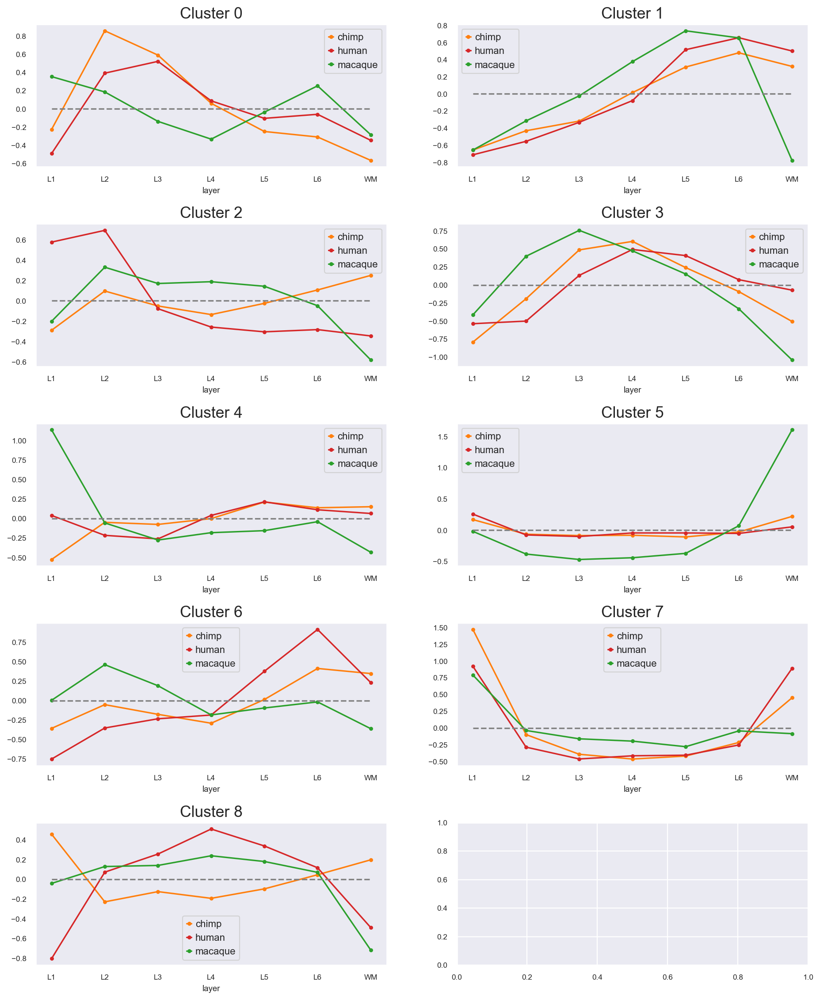

In [40]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')